In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/playground-series-s3e6/sample_submission.csv
/kaggle/input/playground-series-s3e6/train.csv
/kaggle/input/playground-series-s3e6/test.csv


# If you like it! give upvote

# **1.Loading Libraries**

In [2]:
!pip install autoviz

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.7/64.7 kB 265.2 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.9/12.9 MB 13.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 15.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.5/96.5 kB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 46.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 17.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 19.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 19.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 18.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 19.3 MB/s eta 0:00:00
  Attempting uninstall: panel
    Found existing installation: panel 0.14.2
    Uninstalling panel-0.14.2:
      Successfully uninstalled panel-0.14.2
  Attempting uninstall: holoviews
    Found existing i

In [3]:
!pip install -U --pre pycaret

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.1/480.1 kB 765.0 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 256.4/256.4 kB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.7/147.7 kB 4.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... - done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 4.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.8/43.8 kB 2.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.8/106.8 kB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 298.0/298.0 kB 15.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 7.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.8/45.8 kB 3.3 MB/s eta 0:00:00
  Installing build dependencies ... - \ | / - \ | / - \ | / - \ | / - done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━

In [4]:
from catboost import CatBoostRegressor
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from skopt import BayesSearchCV
from statsmodels.stats.outliers_influence import variance_inflation_factor
from autoviz.classify_method import data_cleaning_suggestions ,data_suggestions
from pycaret  import regression
from sklearn.ensemble import GradientBoostingRegressor
from bayes_opt import BayesianOptimization
from sklearn.model_selection import cross_val_score

Imported v0.1.58. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine


# **2.Read Data**

In [5]:
train = pd.read_csv('/kaggle/input/playground-series-s3e6/train.csv')
train = train.drop('id' ,axis = 1)
test  = pd.read_csv('/kaggle/input/playground-series-s3e6/test.csv')

In [6]:
train.head()

,squareMeters,numberOfRooms,hasYard,hasPool,floors,cityCode,cityPartRange,numPrevOwners,made,isNewBuilt,hasStormProtector,basement,attic,garage,hasStorageRoom,hasGuestRoom,price
0,34291,24,1,0,47,35693,2,1,2000,0,1,8,5196,369,0,3,3436795.2
1,95145,60,0,1,60,34773,1,4,2000,0,1,729,4496,277,0,6,9519958.0
2,92661,45,1,1,62,45457,4,8,2020,1,1,7473,8953,245,1,9,9276448.1
3,97184,99,0,0,59,15113,1,1,2000,0,1,6424,8522,256,1,9,9725732.2
4,61752,100,0,0,57,64245,8,4,2018,1,0,7151,2786,863,0,7,6181908.8


# **3.EDA**

## ***3.1 Checking Null***

In [7]:
train.isna().sum()

squareMeters         0
numberOfRooms        0
hasYard              0
hasPool              0
floors               0
cityCode             0
cityPartRange        0
numPrevOwners        0
made                 0
isNewBuilt           0
hasStormProtector    0
basement             0
attic                0
garage               0
hasStorageRoom       0
hasGuestRoom         0
price                0
dtype: int64

# ***3.2 Summary of data***

In [8]:
data_cleaning_suggestions(train)

Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
cityCode,7810,int64,0,0.000000,34.359877,0,
price,7421,float64,0,0.000000,32.648482,0,
squareMeters,7319,int64,0,0.000000,32.199736,0,
attic,5167,int64,0,0.000000,22.732072,0,
basement,4903,int64,0,0.000000,21.570612,0,
garage,896,int64,0,0.000000,3.941927,0,
floors,101,int64,0,0.000000,0.444347,0,
numberOfRooms,100,int64,0,0.000000,0.439947,0,
made,33,int64,0,0.000000,0.145183,0,
hasGuestRoom,11,int64,0,0.000000,0.048394,0,


# ***3.3descriptive statistics***

In [9]:
train.describe().T

,count,mean,std,min,25%,50%,75%,max
squareMeters,22730.0,4.658622e+04,4.952124e+04,89.0,20392.75,44484.0,71547.0,6071330.0
numberOfRooms,22730.0,4.824109e+01,2.822643e+01,1.0,25.00,47.0,75.0,100.0
hasYard,22730.0,4.758909e-01,4.994294e-01,0.0,0.00,0.0,1.0,1.0
hasPool,22730.0,4.527497e-01,4.977733e-01,0.0,0.00,0.0,1.0,1.0
floors,22730.0,4.730598e+01,4.777721e+01,1.0,25.00,45.0,69.0,6000.0
cityCode,22730.0,5.001380e+04,3.000664e+04,3.0,22936.00,50414.0,76291.0,491100.0
cityPartRange,22730.0,5.585042e+00,2.739533e+00,1.0,3.00,6.0,8.0,10.0
numPrevOwners,22730.0,5.620766e+00,2.713026e+00,1.0,3.00,6.0,8.0,10.0
made,22730.0,2.008005e+03,1.188268e+02,1990.0,2000.00,2006.0,2014.0,10000.0
isNewBuilt,22730.0,4.679718e-01,4.989841e-01,0.0,0.00,0.0,1.0,1.0


# **3.4 Detecting outlier**

## ***3.4.1 Detecting Oulier Percentage***

In [10]:
def detect_outliers(data):
    outlier_percents = {}
    for column in data.columns:
        q1 = np.quantile(data[column], 0.25)
        q3 = np.quantile(data[column], 0.75)
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]
        outlier_percent = (outliers.shape[0] / data.shape[0]) * 100
        outlier_percents[column] = outlier_percent
        
    outlier_dataframe = pd.DataFrame(data = outlier_percents.values() ,index=outlier_percents.keys() ,columns=['Outlier_percentage'])
    
    return outlier_dataframe.sort_values(by = 'Outlier_percentage')


detect_outliers(train)

,Outlier_percentage
price,0.000000
numberOfRooms,0.000000
hasYard,0.000000
hasPool,0.000000
hasStorageRoom,0.000000
hasStormProtector,0.000000
cityPartRange,0.000000
numPrevOwners,0.000000
hasGuestRoom,0.000000
isNewBuilt,0.000000


## ***3.4.2 outlier_removal***

In [11]:
def outlier_removal(data , i):
    q1 = np.quantile(data[i] ,0.25)
    q3 = np.quantile(data[i] , 0.75)
    iqr = q3-q1
    lower_tail = q1 - 1.5*iqr
    upper_tail = q3 + 1.5*iqr
    data.drop(data[data[i]> upper_tail].index , inplace = True)
    data.drop(data[data[i]< lower_tail].index ,inplace =True)
    
outlier_list = ['squareMeters' ,'floors','garage' ,'basement' ,'made' ,'cityCode' ,'attic']
for  i in outlier_list:
    outlier_removal(train ,i)

## ***3.4.3 Checking oulier percentage after removal of outliers***

In [12]:
detect_outliers(train)

,Outlier_percentage
squareMeters,0.0
hasStorageRoom,0.0
garage,0.0
attic,0.0
basement,0.0
hasStormProtector,0.0
isNewBuilt,0.0
hasGuestRoom,0.0
made,0.0
cityPartRange,0.0


# **3.5 Corrleation Matrix**

<AxesSubplot:>

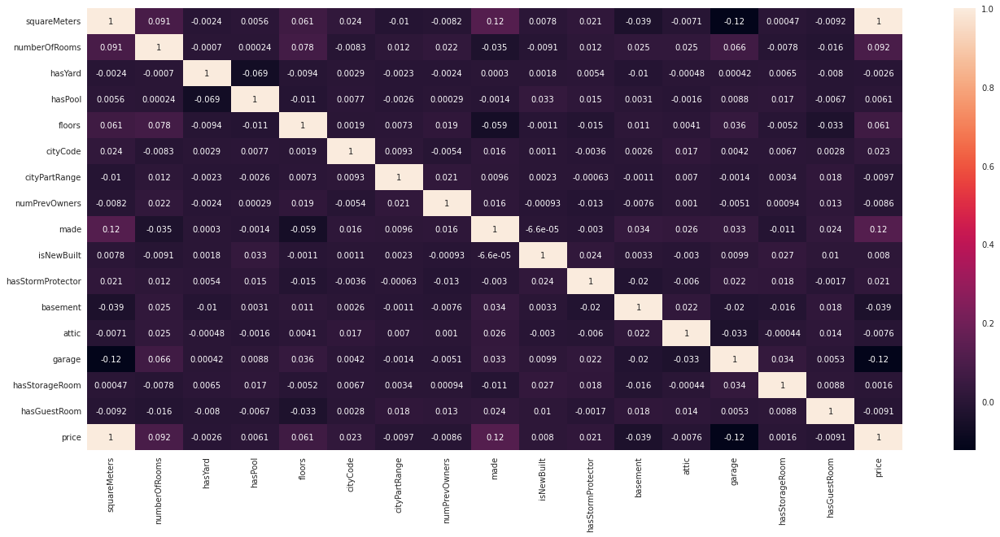

In [13]:
plt.figure(figsize=(20,10))
sns.heatmap(train.corr(),annot=True)

# **3.7 Plots**

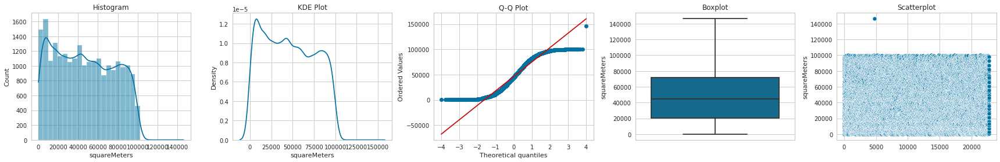

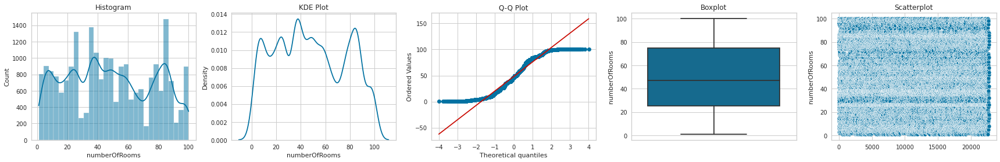

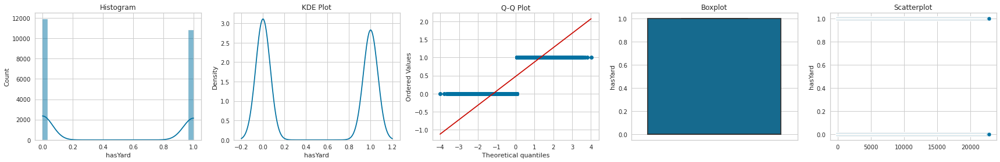

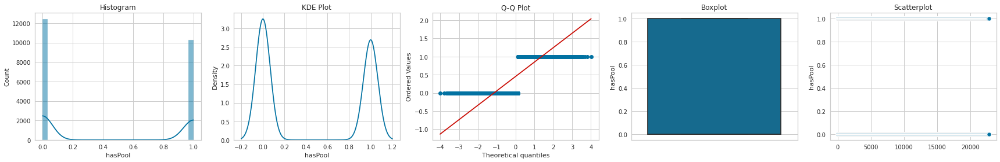

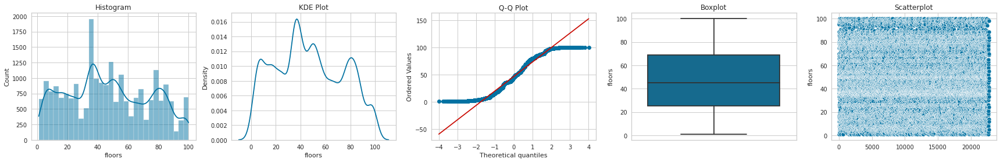

...

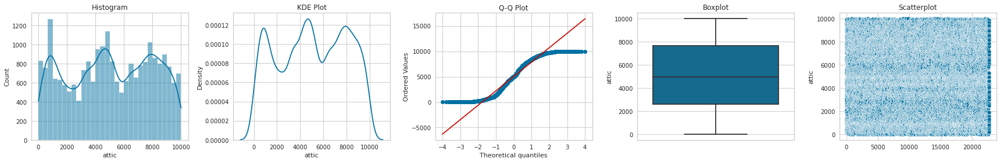

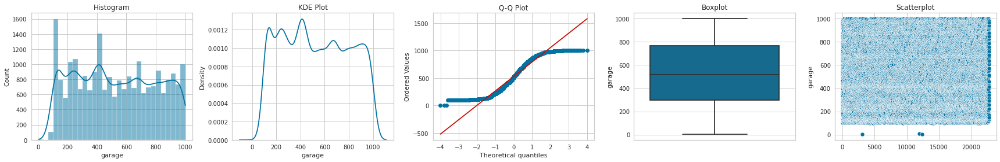

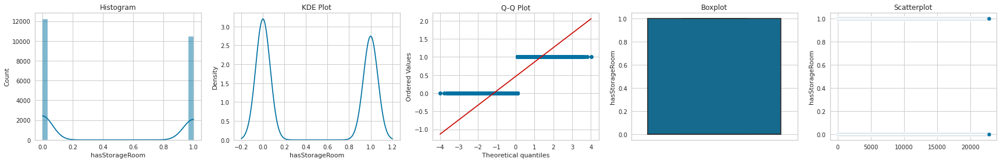

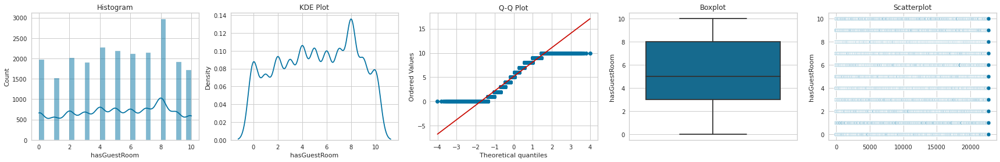

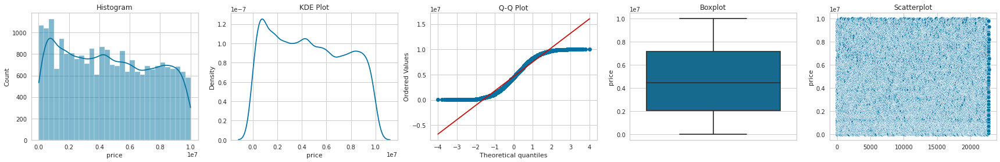

In [14]:
def plots(df, variable):
    # define figure size
    fig, ax = plt.subplots(1, 5, figsize=(24, 4))
    
    # histogram
    sns.histplot(df[variable], bins=30, kde=True, ax=ax[0])
    ax[0].set_title('Histogram')
    
    # KDE plot
    sns.kdeplot(df[variable], ax=ax[1])
    ax[1].set_title('KDE Plot')
    
    # Q-Q plots
    stats.probplot(df[variable], dist="norm", plot=ax[2])
    ax[2].set_title('Q-Q Plot')
    
    # boxplot
    sns.boxplot(y=df[variable], ax=ax[3])
    ax[3].set_title('Boxplot')
    
    # scatterplot
    sns.scatterplot(x=df.index, y=df[variable], ax=ax[4])
    ax[4].set_title('Scatterplot')
    
    plt.tight_layout()
    plt.show()

for i in train.columns:
    plots(train ,i)

# **3.8 Defining feature and target**

In [15]:
X = train.drop('price' ,axis =1)
y = train['price']

# **3.9 Checking Multicollinearity**

<AxesSubplot:>

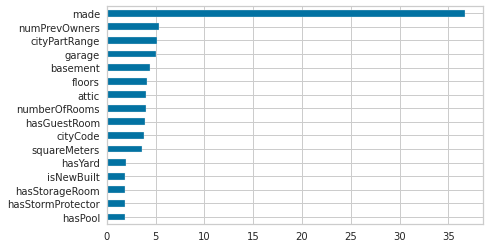

In [16]:
vif_list = []
for i in range(len(X.columns)):
    vif = variance_inflation_factor(X.to_numpy() ,i)
    vif_list.append(vif)
    
s1 = pd.Series(vif_list ,index = X.columns)
s1.sort_values().plot(kind = 'barh')

<AxesSubplot:>

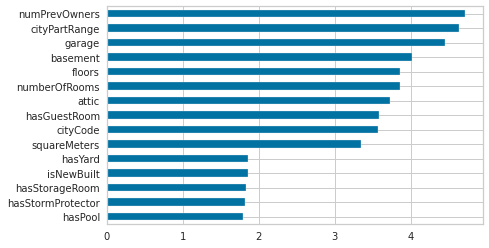

In [17]:
#dropping 'made' column from X 
X = X.drop('made' ,axis = 1)
vif_list = []
for i in range(len(X.columns)):
    vif = variance_inflation_factor(X.to_numpy() ,i)
    vif_list.append(vif)
    
s1 = pd.Series(vif_list ,index = X.columns)
s1.sort_values().plot(kind = 'barh')

# **3.10 Model Creation**

In [18]:
regression.setup(X,target=y ,session_id=42) #UG #PS

,Description,Value
0,Session id,42
1,Target,price
2,Target type,Regression
3,Original data shape,"(22704, 16)"
4,Transformed data shape,"(22704, 16)"
5,Transformed train set shape,"(15892, 16)"
6,Transformed test set shape,"(6812, 16)"
7,Numeric features,15
8,Preprocess,True
9,Imputation type,simple


## ***3.10.1 Comparing Models***

In [19]:
regression.compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
gbr,Gradient Boosting Regressor,26383.2614,30923792985.4349,159143.9386,0.9964,0.1083,0.0316,1.3470
lightgbm,Light Gradient Boosting Machine,32026.7656,33945268203.0242,168511.7818,0.9960,0.1206,0.0362,0.3610
xgboost,Extreme Gradient Boosting,20688.3197,33733801676.8000,164515.0293,0.9960,0.1059,0.0263,1.2320
rf,Random Forest Regressor,12398.3623,34350700932.4768,168754.7606,0.9960,0.0923,0.0204,3.7560
catboost,CatBoost Regressor,31632.8579,34975336938.9648,171287.4984,0.9959,0.1126,0.0347,4.8130
et,Extra Trees Regressor,18502.3143,40721207202.2164,187804.1601,0.9952,0.0993,0.0248,2.4780
huber,Huber Regressor,9939.9793,49394409598.9446,197278.4151,0.9942,0.0953,0.0213,0.1210
lar,Least Angle Regression,17871.5546,49335109095.7005,198319.9045,0.9942,0.1030,0.0276,0.0390
omp,Orthogonal Matching Pursuit,15765.3398,49326434051.9672,198026.2567,0.9942,0.0999,0.0253,0.0450
llar,Lasso Least Angle Regression,17767.4625,49331998908.9805,198300.7173,0.9942,0.1029,0.0275,0.0410


Processing:   0%|          | 0/85 [00:00<?, ?it/s]

GradientBoostingRegressor(random_state=42)

## ***3.10.2 GradientBoostingRegressor with BayesianOptimization***

In [20]:
def gradient_boosting(n_estimators, learning_rate, max_depth, min_samples_split, min_samples_leaf):
    model = GradientBoostingRegressor(
        n_estimators=int(n_estimators),
        learning_rate=learning_rate,
        max_depth=int(max_depth),
        min_samples_split=int(min_samples_split),
        min_samples_leaf=int(min_samples_leaf),
        random_state=0
    )
    
    score = np.average(cross_val_score(model, X, y, cv=5))
    return score

In [21]:
# optimizer = BayesianOptimization(
#     f=gradient_boosting,
#     pbounds={
#         "n_estimators": (100, 1000),
#         "learning_rate": (0.01, 0.5),
#         "max_depth": (3, 10),
#         "min_samples_split": (2, 20),
#         "min_samples_leaf": (1, 10)
#     }
# )

# # Run the optimization
# optimizer.maximize(n_iter=20)

# # Print the optimal hyperparameters
# print("Optimal Hyperparameters: ", optimizer.max)

## ***3.10.3 Final Model***

In [22]:
params = {'learning_rate': 0.0349341638276517,
          'max_depth': 6.053373695879876, 
          'min_samples_leaf': 7.80741417622747,
          'min_samples_split': 18.85291517731112,
          'n_estimators': 187.5923987286547}
final_model = GradientBoostingRegressor(learning_rate=params['learning_rate'],
                                       max_depth=round(params['max_depth']),
                                       min_samples_leaf=round(params['min_samples_leaf']),
                                       min_samples_split=round(params['min_samples_split']),
                                       n_estimators=round(params['n_estimators']))

# **3.11 Making Prediction on testing**

In [23]:
test = test.drop(['id' ,'made'] ,axis=1)
final_model.fit(X,y)
pred = final_model.predict(test)


# **3.12 Feature importance**

<AxesSubplot:>

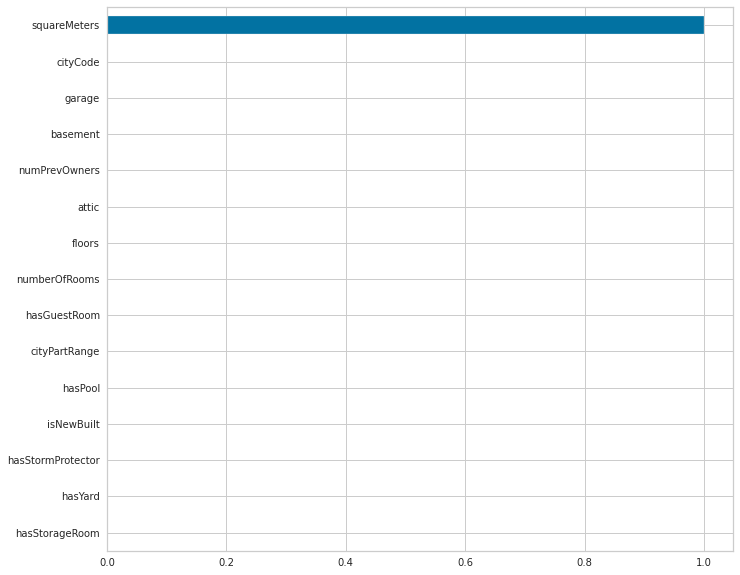

In [24]:
importance = final_model.feature_importances_
columns = final_model.feature_names_in_
df = pd.Series(data = importance , index = columns)
df.sort_values().plot(kind = 'barh' ,figsize = (10,10))

In [25]:
df.sort_values(ascending=False)

squareMeters         9.990231e-01
cityCode             6.244833e-04
garage               1.550145e-04
basement             9.067617e-05
numPrevOwners        2.941688e-05
attic                2.863891e-05
floors               2.402459e-05
numberOfRooms        1.450021e-05
hasGuestRoom         7.352080e-06
cityPartRange        1.118872e-06
hasPool              9.180072e-07
isNewBuilt           2.385547e-07
hasStormProtector    2.374038e-07
hasYard              1.605337e-07
hasStorageRoom       7.451700e-08
dtype: float64

# **3.13 Submission**

In [26]:
sub = pd.read_csv('/kaggle/input/playground-series-s3e6/sample_submission.csv')
sub['price'] = pred
sub.to_csv('submission.csv' ,index = False)